# M2LInES Pangeo Example - Ocean Channel

In [1]:
import xgcm
import hvplot.xarray

## Open data from https://catalog.pangeo.io/

In [2]:
from intake import open_catalog
cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/channel.yaml")
list(cat)

['MITgcm_channel_flatbottom_02km_run01_phys-mon',
 'MITgcm_channel_flatbottom_02km_run01_phys_snap15D',
 'channel_ridge_resolutions_01km',
 'channel_ridge_resolutions_05km',
 'channel_ridge_resolutions_20km',
 'run_tracers_restored_zarr',
 'channel_ridge_05km_float_run',
 'channel_ridge_05km_floats']

In [3]:
ds = cat['MITgcm_channel_flatbottom_02km_run01_phys_snap15D'].to_dask()
ds

<xarray.Dataset>
Dimensions:  (YC: 1000, XC: 500, time: 25, Z: 76, Zp1: 77, XG: 500, YG: 1000,
              Zl: 76, Zu: 76)
Coordinates: (12/26)
    Depth    (YC, XC) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>
    PHrefC   (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
    PHrefF   (Zp1) float32 dask.array<chunksize=(77,), meta=np.ndarray>
  * XC       (XC) float32 1e+03 3e+03 5e+03 7e+03 ... 9.95e+05 9.97e+05 9.99e+05
  * XG       (XG) float32 0.0 2e+03 4e+03 6e+03 ... 9.94e+05 9.96e+05 9.98e+05
  * YC       (YC) float32 1e+03 3e+03 5e+03 ... 1.995e+06 1.997e+06 1.999e+06
    ...       ...
    iter     (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
    rA       (YC, XC) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>
    rAs      (YG, XC) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>
    rAw      (YC, XG) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>
    rAz      (YG, XG) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>
  * time     (time) timedelta64[ns] 1620 days 1635 days ... 1965 days 1980 days
Data variables:
    PH       (time, Z, YC, XC) float32 dask.array<chunksize=(1, 76, 1000, 500), meta=np.ndarray>
    T        (time, Z, YC, XC) float32 dask.array<chunksize=(1, 76, 1000, 500), meta=np.ndarray>
    U        (time, Z, YC, XG) float32 dask.array<chunksize=(1, 76, 1000, 500), meta=np.ndarray>
    V        (time, Z, YG, XC) float32 dask.array<chunksize=(1, 76, 1000, 500), meta=np.ndarray>
    W        (time, Zl, YC, XC) float32 dask.array<chunksize=(1, 76, 1000, 500), meta=np.ndarray>

## Visualize with hvplot

In [4]:
ds.T.isel(Z=0).hvplot(x='XC', y='YC', rasterize=True, clim=(1,7), width=550, height=700, cmap='magma')

:DynamicMap   [time]
   :Image   [XC,YC]   (T)

## Coarsen with Xarray

In [5]:
T_coarse=ds.T.coarsen(XC=20, YC=20).mean()
T_coarse

/tmp/ipykernel_502/2978988895.py:1: PerformanceWarning: Reshaping is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array.reshape(shape)

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array.reshape(shape)Explictly passing ``limit`` to ``reshape`` will also silence this warning
    >>> array.reshape(shape, limit='128 MiB')
  T_coarse=ds.T.coarsen(XC=20, YC=20).mean()


<xarray.DataArray 'T' (time: 25, Z: 76, YC: 50, XC: 25)>
dask.array<mean_agg-aggregate, shape=(25, 76, 50, 25), dtype=float32, chunksize=(1, 76, 50, 25), chunktype=numpy.ndarray>
Coordinates:
    Depth    (YC, XC) float32 dask.array<chunksize=(50, 25), meta=np.ndarray>
    PHrefC   (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
  * XC       (XC) float32 2e+04 6e+04 1e+05 1.4e+05 ... 9e+05 9.4e+05 9.8e+05
  * YC       (YC) float32 2e+04 6e+04 1e+05 ... 1.9e+06 1.94e+06 1.98e+06
  * Z        (Z) float32 -0.5 -1.57 -2.79 ... -2.626e+03 -2.757e+03 -2.913e+03
    drF      (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
    hFacC    (Z, YC, XC) float32 dask.array<chunksize=(76, 50, 25), meta=np.ndarray>
    iter     (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
    rA       (YC, XC) float32 dask.array<chunksize=(50, 25), meta=np.ndarray>
  * time     (time) timedelta64[ns] 1620 days 1635 days ... 1965 days 1980 days
Attributes:
    long_name:      Potential Temperature
    standard_name:  sea_water_potential_temperature
    units:          degree_Celcius

In [6]:
options = dict(x='XC', y='YC', width=550, height=700, cmap='magma')
(
    ds.T.isel(Z=0).hvplot(rasterize=True, **options) + 
    T_coarse.isel(Z=0).hvplot(**options)
)

:Layout
   .DynamicMap.I  :DynamicMap   [time]
      :Image   [XC,YC]   (T)
   .DynamicMap.II :DynamicMap   [time]
      :Image   [XC,YC]   (T)

## Compute Vorticity with Xgcm

In [7]:
import xgcm

grid = xgcm.Grid(ds)
grid

<xgcm.Grid>
X Axis (periodic, boundary=None):
  * center   XC --> left
  * left     XG --> center
T Axis (periodic, boundary=None):
  * center   time
Y Axis (periodic, boundary=None):
  * center   YC --> left
  * left     YG --> center
Z Axis (periodic, boundary=None):
  * center   Z --> left
  * outer    Zp1 --> center
  * left     Zl --> center
  * right    Zu --> center

$$ \zeta = \delta_i \Delta y_g \Delta r_f h_w u + \delta_j \Delta x_g \Delta r_f h_s v ) / A_c $$

In [8]:
@xgcm.as_grid_ufunc(
     "(Y:center,X:left),(Y:center,X:left),(Y:left,X:center),(Y:left,X:center),(Y:left,X:left)->(Y:left,X:left)",
     boundary_width={"X": (1, 0), "Y": (1, 0)},
)
def vorticity(u, dxc, v, dyc, raz):
    u_trans = u * dxc
    v_trans = v * dyc
    v_diff_x = v_trans[..., 1:, 1:] - v_trans[..., 1:, :-1]
    u_diff_y = u_trans[..., 1:, 1:] - u_trans[..., :-1, 1:]
    return (v_diff_x - u_diff_y) / raz[..., 1:, 1:]

In [9]:
ζ = vorticity(grid, ds.U, ds.dxC, ds.V, ds.dyC, ds.rAz, axis=5*[("Y", "X")], dask="parallelized")
ζ

<xarray.DataArray (time: 25, Z: 76, YG: 1000, XG: 500)>
dask.array<transpose, shape=(25, 76, 1000, 500), dtype=float32, chunksize=(1, 76, 1000, 500), chunktype=numpy.ndarray>
Coordinates:
  * Z        (Z) float32 -0.5 -1.57 -2.79 ... -2.626e+03 -2.757e+03 -2.913e+03
    drF      (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
    PHrefC   (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
  * XG       (XG) float32 0.0 2e+03 4e+03 6e+03 ... 9.94e+05 9.96e+05 9.98e+05
  * YG       (YG) float32 0.0 2e+03 4e+03 ... 1.994e+06 1.996e+06 1.998e+06
  * time     (time) timedelta64[ns] 1620 days 1635 days ... 1965 days 1980 days
    iter     (time) int64 dask.array<chunksize=(1,), meta=np.ndarray>
    rAz      (YG, XG) float32 dask.array<chunksize=(1000, 500), meta=np.ndarray>

In [10]:
ζ.isel(Z=0).hvplot(x='XG', y='YG', rasterize=True, clim=(-1e-4, 1e-4), width=550, height=700, cmap='RdBu_r')

:DynamicMap   [time]
   :Image   [XG,YG]   (value)

In [11]:
abs_vort = abs(ζ).mean(dim=('time', 'XG'))
abs_vort

<xarray.DataArray (Z: 76, YG: 1000)>
dask.array<mean_agg-aggregate, shape=(76, 1000), dtype=float32, chunksize=(76, 1000), chunktype=numpy.ndarray>
Coordinates:
  * Z        (Z) float32 -0.5 -1.57 -2.79 ... -2.626e+03 -2.757e+03 -2.913e+03
    drF      (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
    PHrefC   (Z) float32 dask.array<chunksize=(76,), meta=np.ndarray>
  * YG       (YG) float32 0.0 2e+03 4e+03 ... 1.994e+06 1.996e+06 1.998e+06

In [12]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    abs_vort.load()

[########################################] | 100% Completed | 27.6s


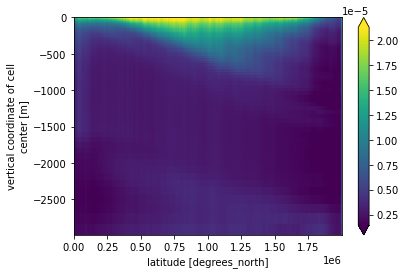

In [13]:
abs_vort.plot(x='YG', robust=True)